In [1]:
%matplotlib inline

In [2]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import pickle
import seaborn as sns
from vtk_rw import read_vtk
from plotting import plot_surf_stat_map, crop_img
import matplotlib as mpl

/home/raid3/huntenburg/workspace/anaconda2/envs/myelinconnect/lib/python2.7/site-packages/IPython/html.py:14: ShimWarning: The `IPython.html` package has been deprecated. You should import from `notebook` instead. `IPython.html.widgets` has moved to `ipywidgets`.
  "`IPython.html.widgets` has moved to `ipywidgets`.", ShimWarning)


In [3]:
def load_pickle(pkl_file):
    pkl_in = open(pkl_file, 'r')
    pkl_dict = pickle.load(pkl_in)
    pkl_in.close()
    return pkl_dict

In [4]:
lh_mesh_file = '/scr/ilz3/myelinconnect/new_groupavg/surfs/lowres/inflated/lh_lowres_new_infl100.vtk'
lh_sulc_file = '/scr/ilz3/myelinconnect/new_groupavg/surfs/lowres/sulc/lh_sulc.npy'
rh_mesh_file = '/scr/ilz3/myelinconnect/new_groupavg/surfs/lowres/inflated/rh_lowres_new_infl100.vtk'
rh_sulc_file = '/scr/ilz3/myelinconnect/new_groupavg/surfs/lowres/sulc/rh_sulc.npy'
fullmask_file = '/scr/ilz3/myelinconnect/new_groupavg/masks/fullmask_lh_rh_new.npy'
lh_sulc = np.load(lh_sulc_file)
lv, lf, _ = read_vtk(lh_mesh_file)
rh_sulc = np.load(rh_sulc_file)
rv, rf, _ = read_vtk(rh_mesh_file)
fullmask = np.load(fullmask_file)

In [5]:
subjects = pd.read_csv('/scr/ilz3/myelinconnect/subjects.csv')
subjects=list(subjects['DB'])
subjects.remove('KSMT')

In [6]:
sns.set_style('white')
cropped_embed = []

for sub in subjects:
    for sess in ['sess1', 'sess2']:
        embed_dict=load_pickle('/scr/ilz3/myelinconnect/new_groupavg/embed/indv/%s_%s_both_smooth_3_embed_dict.pkl'%(sub, sess))
        
        # normalize vectors
        embed_masked = np.zeros((embed_dict['vectors'].shape[0], embed_dict['vectors'].shape[1]-1))
        for comp in range(100):
            embed_masked[:,comp]=(embed_dict['vectors'][:,comp+1]/embed_dict['vectors'][:,0])

        # unmask the embedding, that has been saved in masked form
        idcs=np.arange(0,(lv.shape[0]+rv.shape[0]))
        nonmask=np.delete(idcs, fullmask)
        embed = np.zeros(((lv.shape[0]+rv.shape[0]),100))
        embed[nonmask] = embed_masked 
        
        # create plots
        for (elev, azim) in [(180, 0), (180, 180)]:
            plot=plot_surf_stat_map(lv, lf, stat_map=embed[:lv.shape[0],0], bg_map=lh_sulc, bg_on_stat=True, darkness=0.5, 
                                elev=elev,azim=azim, figsize=(10,7.5) ,threshold=1e-50, cmap='inferno',symmetric_cbar='auto')
            cropped_embed.append(crop_img(plot))

        for (elev, azim) in [(180, 0), (180, 180)]:
            plot=plot_surf_stat_map(rv, rf, stat_map=embed[lv.shape[0]:,0], bg_map=rh_sulc, bg_on_stat=True, darkness=0.5, 
                                elev=elev,azim=azim, figsize=(10,7.5) ,threshold=1e-50, cmap='inferno',symmetric_cbar='auto')
            cropped_embed.append(crop_img(plot))
        

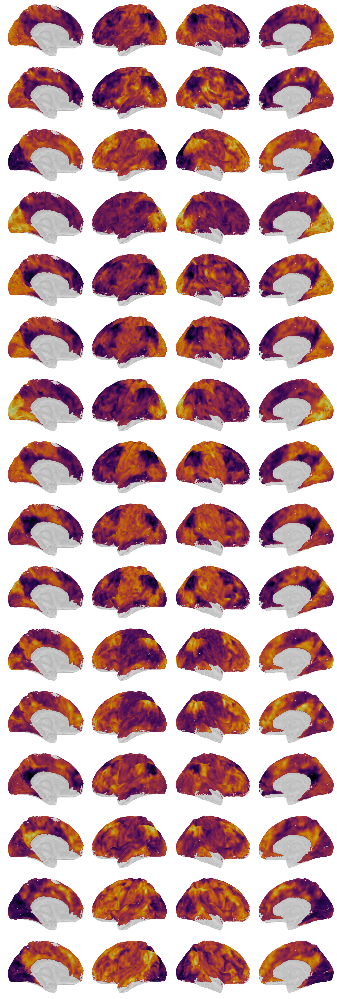

In [7]:
sns.set_style('white')
plots = int(len(cropped_embed)/4)
height = plots*5
fig = plt.figure(figsize=(40,height))
for img in range(len(cropped_embed)):
    ax = fig.add_subplot(plots,4,img+1)
    plt.imshow(cropped_embed[img])
    ax.set_axis_off
    ax.set_axis_off()
fig.tight_layout()
fig.subplots_adjust(right=0.7)